In [1]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns   
import plotly.express as px

In [2]:
# load dataset & check info
india_housing_prices_df = pd.read_csv("../data/raw_data/india_housing_prices.csv")
india_housing_prices_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 23 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   ID                              250000 non-null  int64  
 1   State                           250000 non-null  object 
 2   City                            250000 non-null  object 
 3   Locality                        250000 non-null  object 
 4   Property_Type                   250000 non-null  object 
 5   BHK                             250000 non-null  int64  
 6   Size_in_SqFt                    250000 non-null  int64  
 7   Price_in_Lakhs                  250000 non-null  float64
 8   Price_per_SqFt                  250000 non-null  float64
 9   Year_Built                      250000 non-null  int64  
 10  Furnished_Status                250000 non-null  object 
 11  Floor_No                        250000 non-null  int64  
 12  Total_Floors    

In [3]:
# view few rows of the dataset
display(india_housing_prices_df.head())
display(india_housing_prices_df.tail())

,ID,State,City,Locality,Property_Type,BHK,Size_in_SqFt,Price_in_Lakhs,Price_per_SqFt,Year_Built,...,Age_of_Property,Nearby_Schools,Nearby_Hospitals,Public_Transport_Accessibility,Parking_Space,Security,Amenities,Facing,Owner_Type,Availability_Status
0,1,Tamil Nadu,Chennai,Locality_84,Apartment,1,4740,489.76,0.10,1990,...,35,10,3,High,No,No,"Playground, Gym, Garden, Pool, Clubhouse",West,Owner,Ready_to_Move
1,2,Maharashtra,Pune,Locality_490,Independent House,3,2364,195.52,0.08,2008,...,17,8,1,Low,No,Yes,"Playground, Clubhouse, Pool, Gym, Garden",North,Builder,Under_Construction
2,3,Punjab,Ludhiana,Locality_167,Apartment,2,3642,183.79,0.05,1997,...,28,9,8,Low,Yes,No,"Clubhouse, Pool, Playground, Gym",South,Broker,Ready_to_Move
3,4,Rajasthan,Jodhpur,Locality_393,Independent House,2,2741,300.29,0.11,1991,...,34,5,7,High,Yes,Yes,"Playground, Clubhouse, Gym, Pool, Garden",North,Builder,Ready_to_Move
4,5,Rajasthan,Jaipur,Locality_466,Villa,4,4823,182.90,0.04,2002,...,23,4,9,Low,No,Yes,"Playground, Garden, Gym, Pool, Clubhouse",East,Builder,Ready_to_Move


,ID,State,City,Locality,Property_Type,BHK,Size_in_SqFt,Price_in_Lakhs,Price_per_SqFt,Year_Built,...,Age_of_Property,Nearby_Schools,Nearby_Hospitals,Public_Transport_Accessibility,Parking_Space,Security,Amenities,Facing,Owner_Type,Availability_Status
249995,249996,Gujarat,Ahmedabad,Locality_187,Independent House,5,1995,274.75,0.14,1995,...,30,8,6,Low,No,No,"Playground, Garden, Gym, Clubhouse, Pool",East,Broker,Under_Construction
249996,249997,Tamil Nadu,Chennai,Locality_348,Apartment,1,2293,13.40,0.01,2013,...,12,8,10,Low,No,No,Playground,South,Broker,Ready_to_Move
249997,249998,Telangana,Warangal,Locality_225,Villa,4,2910,236.94,0.08,2003,...,22,10,4,High,Yes,Yes,Playground,South,Builder,Under_Construction
249998,249999,Odisha,Cuttack,Locality_138,Villa,1,1149,141.66,0.12,2007,...,18,3,7,Low,Yes,Yes,"Playground, Gym, Pool",South,Owner,Ready_to_Move
249999,250000,Haryana,Gurgaon,Locality_268,Independent House,3,4313,199.69,0.05,1990,...,35,10,6,Medium,No,No,"Gym, Garden",South,Owner,Under_Construction


In [4]:
# check dataset row & column counts
print(f"Dataset contains {india_housing_prices_df.shape[0]} rows and {india_housing_prices_df.shape[1]} columns.")

Dataset contains 250000 rows and 23 columns.


In [5]:
# check for duplicate rows
print(f"duplicate rows: {india_housing_prices_df.duplicated().sum()}") # 0 duplicate rows

duplicate rows: 0


In [6]:
# check for missing/null values
print(f"Missing values in each column:\n{india_housing_prices_df.isnull().sum()}") # no missing values

Missing values in each column:
ID                                0
State                             0
City                              0
Locality                          0
Property_Type                     0
BHK                               0
Size_in_SqFt                      0
Price_in_Lakhs                    0
Price_per_SqFt                    0
Year_Built                        0
Furnished_Status                  0
Floor_No                          0
Total_Floors                      0
Age_of_Property                   0
Nearby_Schools                    0
Nearby_Hospitals                  0
Public_Transport_Accessibility    0
Parking_Space                     0
Security                          0
Amenities                         0
Facing                            0
Owner_Type                        0
Availability_Status               0
dtype: int64


In [7]:
# descriptive statistics
india_housing_prices_df.describe()

,ID,BHK,Size_in_SqFt,Price_in_Lakhs,Price_per_SqFt,Year_Built,Floor_No,Total_Floors,Age_of_Property,Nearby_Schools,Nearby_Hospitals
count,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000
mean,125000.500000,2.999396,2749.813216,254.586854,0.130597,2006.520012,14.966800,15.503004,18.479988,5.499860,5.498016
std,72168.927986,1.415521,1300.606954,141.349921,0.130747,9.808575,8.948047,8.671618,9.808575,2.878639,2.871860
min,1.000000,1.000000,500.000000,10.000000,0.000000,1990.000000,0.000000,1.000000,2.000000,1.000000,1.000000
25%,62500.750000,2.000000,1623.000000,132.550000,0.050000,1998.000000,7.000000,8.000000,10.000000,3.000000,3.000000
50%,125000.500000,3.000000,2747.000000,253.870000,0.090000,2007.000000,15.000000,15.000000,18.000000,5.000000,5.000000
75%,187500.250000,4.000000,3874.000000,376.880000,0.160000,2015.000000,23.000000,23.000000,27.000000,8.000000,8.000000
max,250000.000000,5.000000,5000.000000,500.000000,0.990000,2023.000000,30.000000,30.000000,35.000000,10.000000,10.000000


In [8]:
# check unique values 
for col in india_housing_prices_df.columns:
    print(f"{col}: {india_housing_prices_df[col].nunique()} unique values")

# TODO: add markdown cells explaining total 20 states, 42 cities, 10 property types, etc.

ID: 250000 unique values
State: 20 unique values
City: 42 unique values
Locality: 500 unique values
Property_Type: 3 unique values
BHK: 5 unique values
Size_in_SqFt: 4501 unique values
Price_in_Lakhs: 48700 unique values
Price_per_SqFt: 100 unique values
Year_Built: 34 unique values
Furnished_Status: 3 unique values
Floor_No: 31 unique values
Total_Floors: 30 unique values
Age_of_Property: 34 unique values
Nearby_Schools: 10 unique values
Nearby_Hospitals: 10 unique values
Public_Transport_Accessibility: 3 unique values
Parking_Space: 2 unique values
Security: 2 unique values
Amenities: 325 unique values
Facing: 4 unique values
Owner_Type: 3 unique values
Availability_Status: 2 unique values


In [10]:
# Distribution of property price

fig = px.histogram(india_housing_prices_df, x='Price_in_Lakhs', title='Distribution of Property Price')
fig.show()


In [12]:
# Distribution of property sizes

fig  = px.histogram(india_housing_prices_df, x='Size_in_SqFt', title='Distribution of Property Sizes')
fig.show()

In [16]:
# How does price per sq ft vary by property type

fig = px.box(india_housing_prices_df, x='Property_Type', y='Price_per_SqFt', title='Price per SqFt by Property Type')
fig.show()

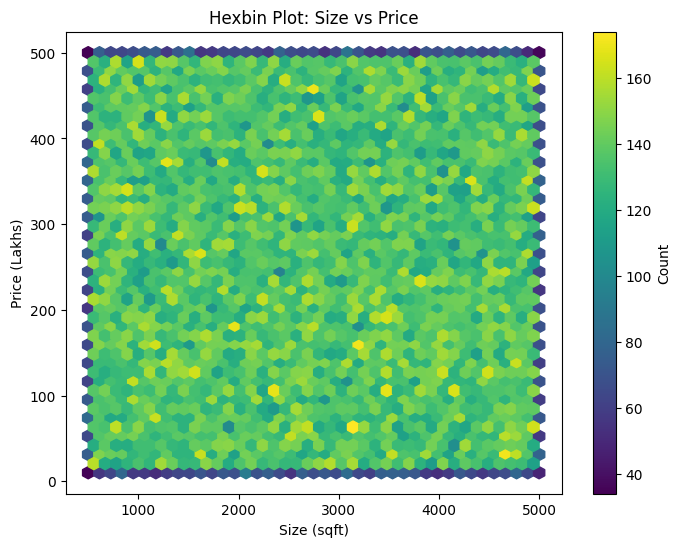

In [ ]:
# check relation between size and price

plt.figure(figsize=(8,6))
plt.hexbin(india_housing_prices_df['Size_in_SqFt'], india_housing_prices_df['Price_in_Lakhs'], gridsize=40, cmap='viridis')
plt.colorbar(label='Count')
plt.xlabel("Size (sqft)")
plt.ylabel("Price (Lakhs)")
plt.title("Hexbin Plot: Size vs Price")
plt.show()

# There is no relation between size and price.
# price depends on other factors like location, property type, amenities, etc. not just size.

In [37]:
#  outliers in price per sqft
fig = px.box(india_housing_prices_df, y='Price_per_SqFt')
fig.show()



In [36]:
# outliers in size
fig = px.box(india_housing_prices_df, y='Size_in_SqFt')
fig.show()